<a href="https://colab.research.google.com/github/Uemerson/image-registration-tests/blob/main/simpleelastix_fire_fundus.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Install and compiling necessary libs

In [1]:
!sudo apt install cmake git build-essential
!git clone https://github.com/SuperElastix/SimpleElastix
!mkdir build
%cd build
!cmake ../SimpleElastix/SuperBuild
!make -j4

Streaming output truncated to the last 5000 lines.
-- [download 46% complete]
[ 26%] Generating PythonTests/AddImageFilterTest.py
[ 26%] Generating TclTests/AddImageFilterTest.tcl
-- [download 52% complete]
-- [download 53% complete]
-- [download 59% complete]
-- [download 65% complete]
-- [download 66% complete]
-- [download 72% complete]
-- [download 79% complete]
-- [download 85% complete]
-- [download 86% complete]
-- [download 92% complete]
-- [download 99% complete]
-- [download 100% complete]
-- Downloaded object: "/content/build/ExternalData/Objects/SHA512/5f72a91474f6138b3e8e717d8e4b16fdd6ff9e5b5db33583ada9b55c68f98ce4e0b37facf201181f89e7e2accabd7e4adf054b23c0b3bc4d1eca2f3dbe8e25a3"
[ 26%] Generating /content/build/SimpleITK-build/ExternalData/Testing/Data/Baseline/BasicFilters_STAPLEImageFilter_basic.nrrd
[ 26%] Generating RTests/AddImageFilterTest.R
-- Fetching "https://simpleitk.s3.amazonaws.com/public/SHA512/7f841e94a05dd51416ce86b51c45c10d7cd46ffa3fc849ab7590f339db6ed6853

In [4]:
%cd ../build/SimpleITK-build/Wrapping/Python

/content/build/SimpleITK-build/Wrapping/Python


In [5]:
!sudo python Packaging/setup.py install

running install
running bdist_egg
running egg_info
writing SimpleITK.egg-info/PKG-INFO
writing dependency_links to SimpleITK.egg-info/dependency_links.txt
writing top-level names to SimpleITK.egg-info/top_level.txt
reading manifest file 'SimpleITK.egg-info/SOURCES.txt'
writing manifest file 'SimpleITK.egg-info/SOURCES.txt'
installing library code to build/bdist.linux-x86_64/egg
running install_lib
running build_py
creating build/lib.linux-x86_64-3.7
creating build/lib.linux-x86_64-3.7/SimpleITK
copying /content/build/SimpleITK-build/Wrapping/Python/__init__.py -> build/lib.linux-x86_64-3.7/SimpleITK
copying /content/build/SimpleITK-build/Wrapping/Python/SimpleITK.py -> build/lib.linux-x86_64-3.7/SimpleITK
running build_ext
copying /content/build/SimpleITK-build/Wrapping/Python/_SimpleITK.so -> build/lib.linux-x86_64-3.7/SimpleITK/_SimpleITK.cpython-37m-x86_64-linux-gnu.so
creating build/bdist.linux-x86_64/egg
creating build/bdist.linux-x86_64/egg/SimpleITK
copying build/lib.linux-x86_6

In [23]:
!pip install py7zr

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 65 kB 2.7 MB/s 
     |████████████████████████████████| 138 kB 16.4 MB/s 
     |████████████████████████████████| 50 kB 6.2 MB/s 
     |████████████████████████████████| 2.3 MB 48.3 MB/s 
     |████████████████████████████████| 357 kB 35.6 MB/s 
     |████████████████████████████████| 94 kB 3.3 MB/s 
     |████████████████████████████████| 2.4 MB 44.8 MB/s 


In [27]:
!pip install pillow

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [45]:
!pip install neurite

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 108 kB 7.8 MB/s 


In [53]:
!pip install patchify

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


# Import necessary libs

In [2]:
import SimpleITK as sitk
from google.colab import drive
import glob
import py7zr
from PIL import Image
import numpy as np
import time
%tensorflow_version 2.x
import tensorflow as tf
assert tf.__version__.startswith('2.'), 'This tutorial assumes Tensorflow 2.0+'
import neurite as ne
from patchify import patchify, unpatchify

# Connect with google drive

In [8]:
# mount drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


# Utils

In [4]:
def dice_coef(y_true, y_pred):
    y_true_f = tf.reshape(tf.dtypes.cast(y_true, tf.float32), [-1])
    y_pred_f = tf.reshape(tf.dtypes.cast(y_pred, tf.float32), [-1])
    intersection = tf.reduce_sum(y_true_f * y_pred_f)
    return (2. * intersection + 1.) / (tf.reduce_sum(y_true_f) + tf.reduce_sum(y_pred_f) + 1.)

# Extract Fire Fundus dataset

In [25]:
colab_dataset_path = "/content/gdrive/My Drive/Colab Notebooks/image-registration/datasets/fire-fundus-image-registration/FIRE.7z"

with py7zr.SevenZipFile(colab_dataset_path, mode='r') as z:
    z.extractall()

# Registration images 2D (convert to scale of gray)

Reg Time (Total): 74.2516
Dice Similarity: 0.3193466067314148


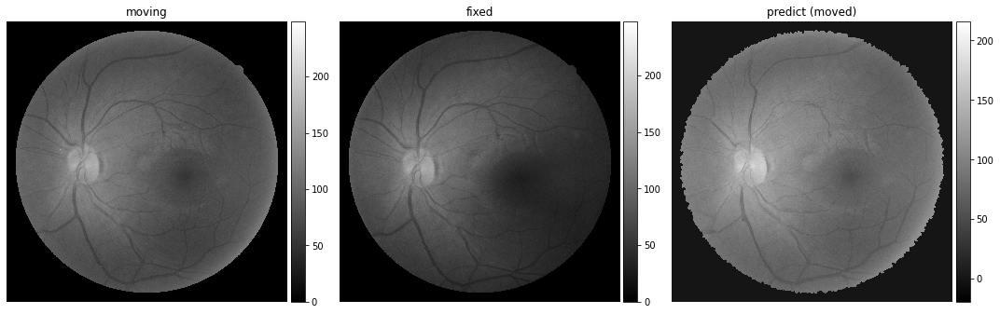


Reg Time (Total): 72.5604
Dice Similarity: 0.2767942249774933


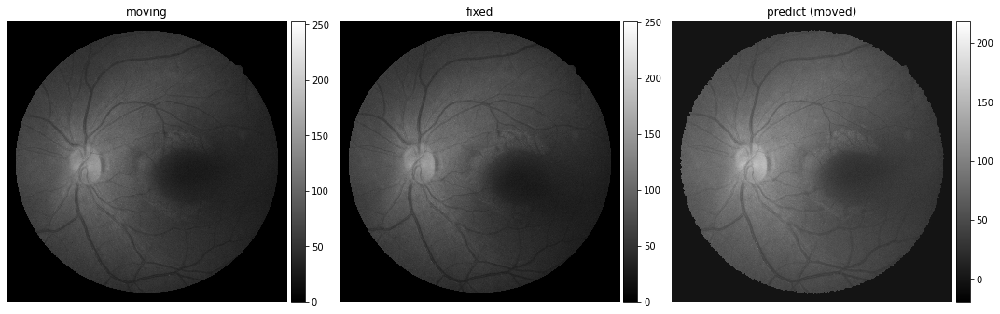


Reg Time (Total): 70.9842
Dice Similarity: 0.3153125047683716


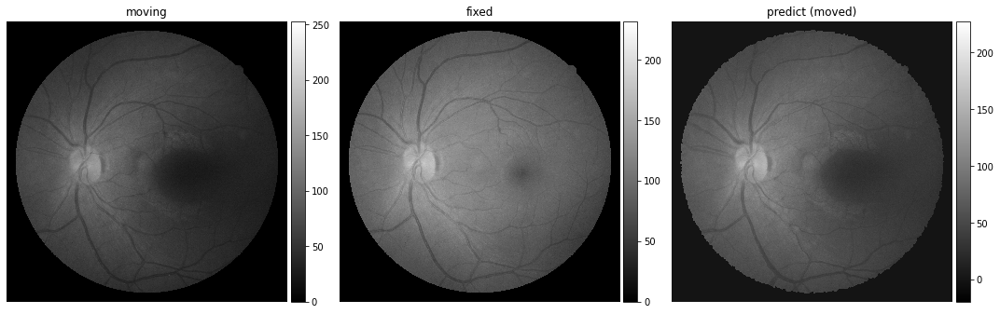


Reg Time (Total): 70.9400
Dice Similarity: 0.2925734221935272


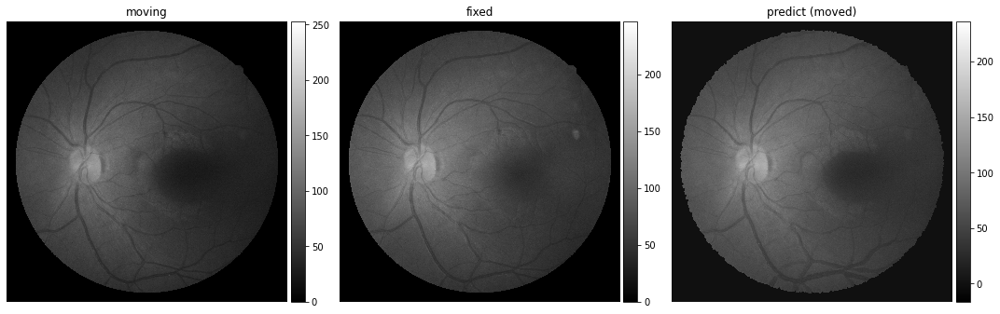


Reg Time (Total): 70.8006
Dice Similarity: 0.28803855180740356


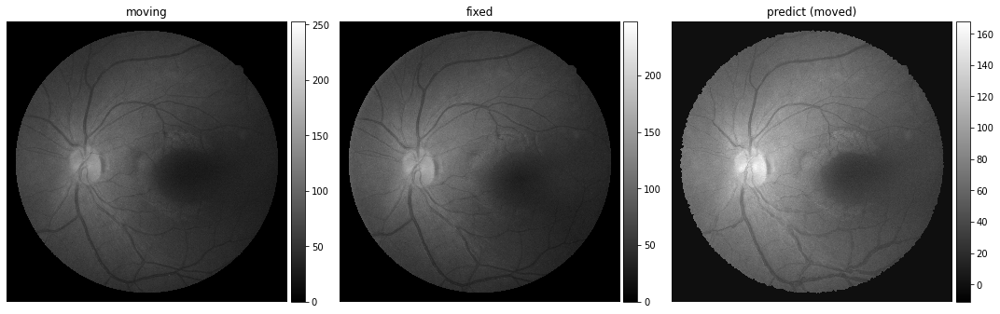


Reg Time (Total): 70.5262
Dice Similarity: 0.3187420964241028


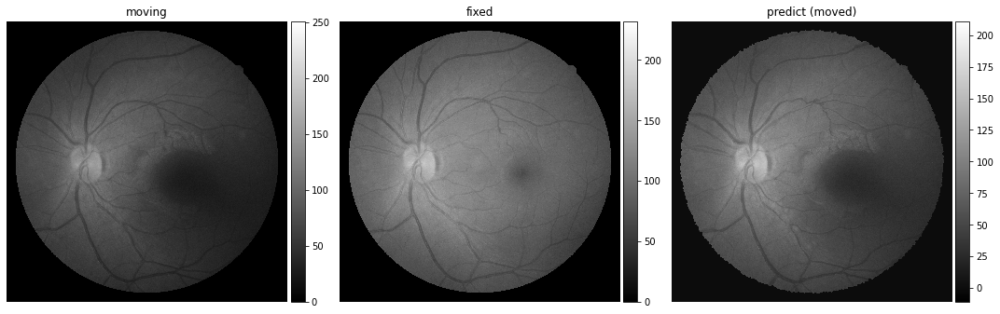


Reg Time (Total): 70.5559
Dice Similarity: 0.295485258102417


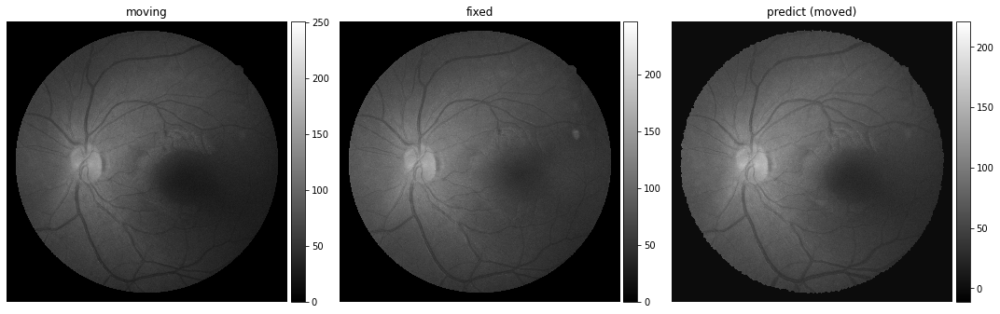


Reg Time (Total): 70.7639
Dice Similarity: 0.29137957096099854


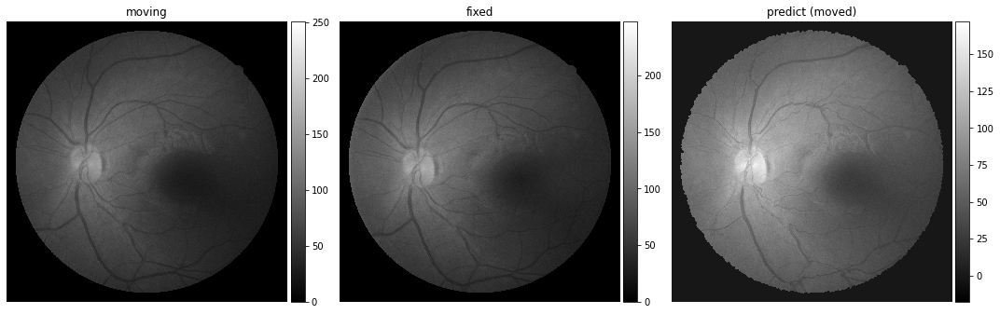


Reg Time (Total): 71.2387
Dice Similarity: 0.34527587890625


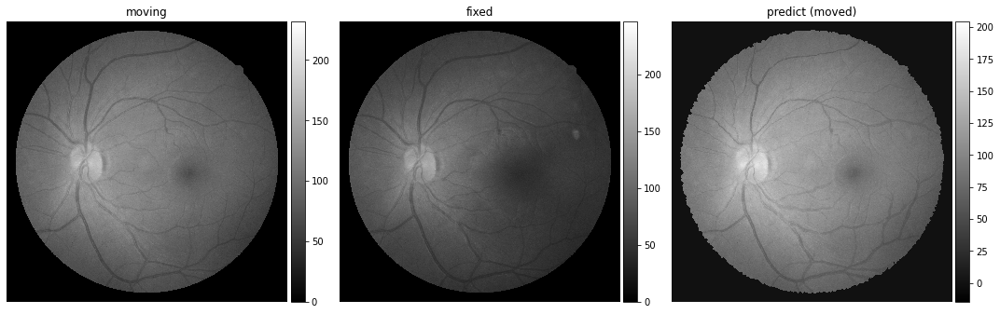


Reg Time (Total): 70.9861
Dice Similarity: 0.3335089087486267


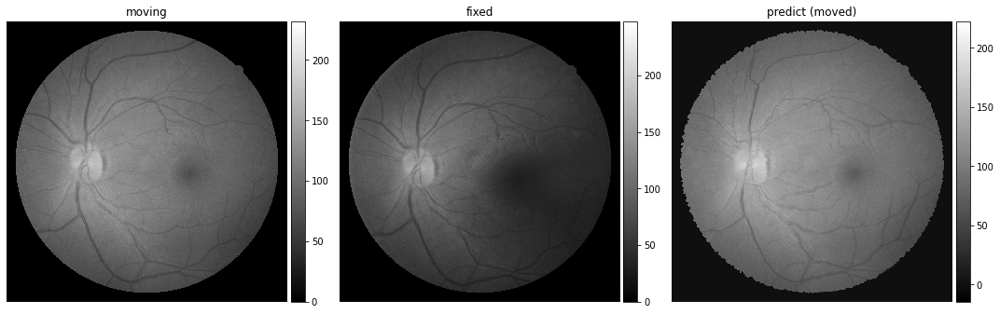


Reg Time (Total): 70.3015
Dice Similarity: 0.3080870509147644


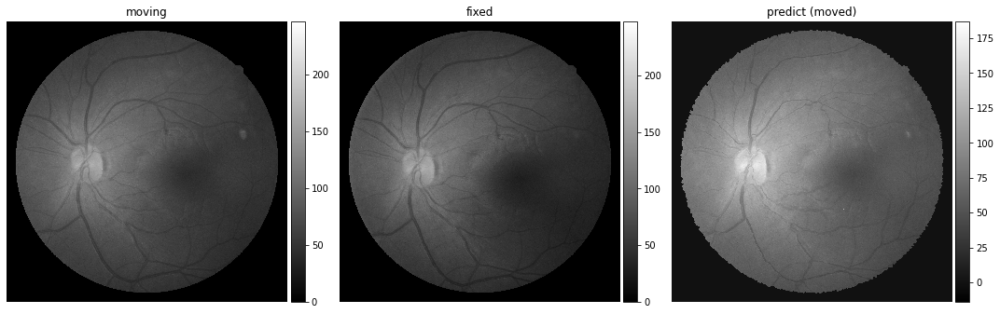


Reg Time (Total): 70.5449
Dice Similarity: 0.47660523653030396


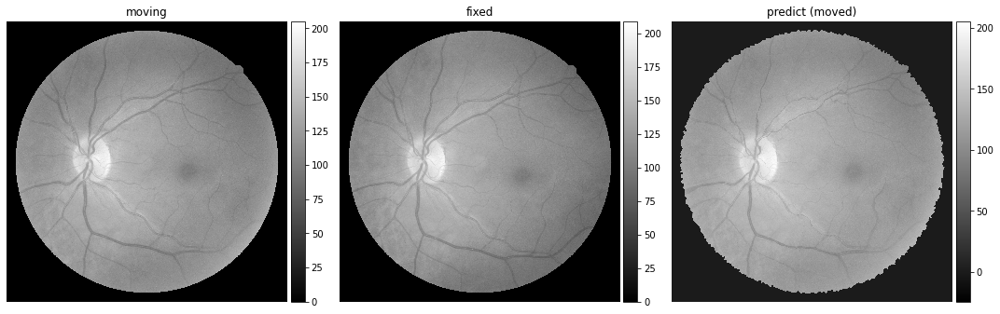


Reg Time (Total): 70.3326
Dice Similarity: 0.4662366211414337


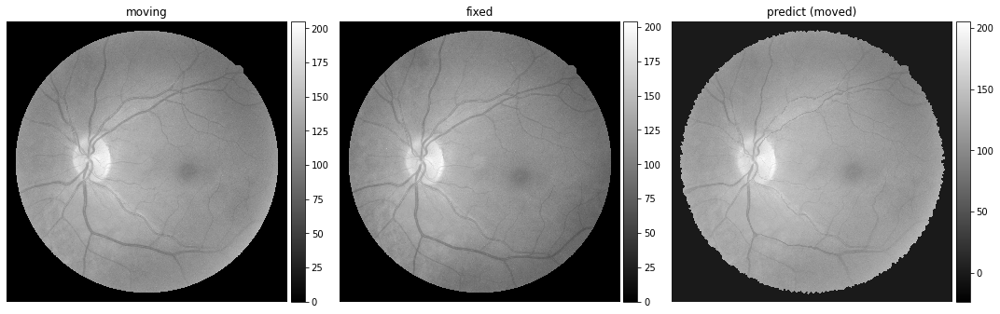


Reg Time (Total): 70.9616
Dice Similarity: 0.4660188853740692


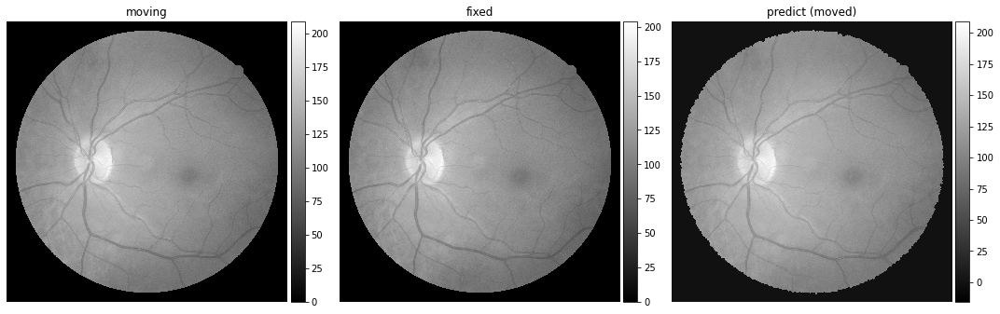


Reg Time (Total): 70.4503
Dice Similarity: 0.3615647256374359


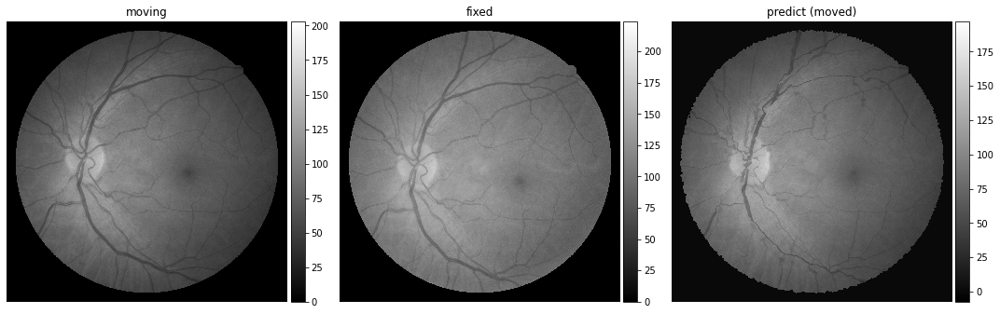


Reg Time (Total): 70.7584
Dice Similarity: 0.43775588274002075


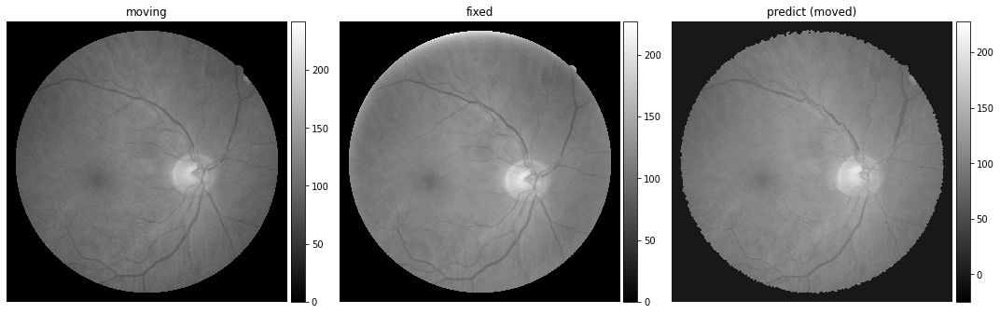


Reg Time (Total): 70.0877
Dice Similarity: 0.44019782543182373


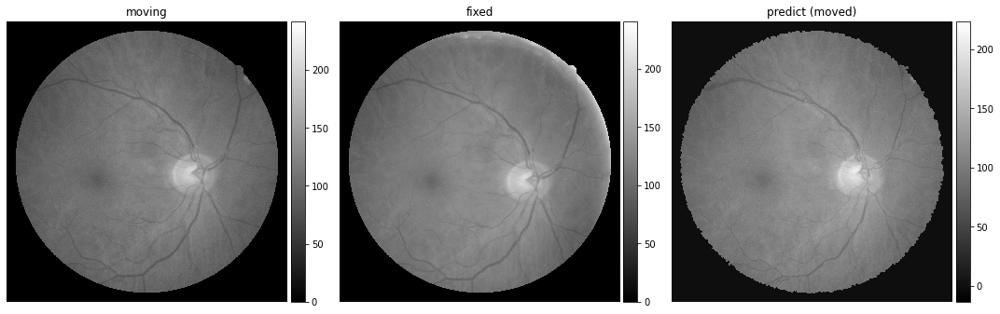


Reg Time (Total): 70.1699
Dice Similarity: 0.4335671067237854


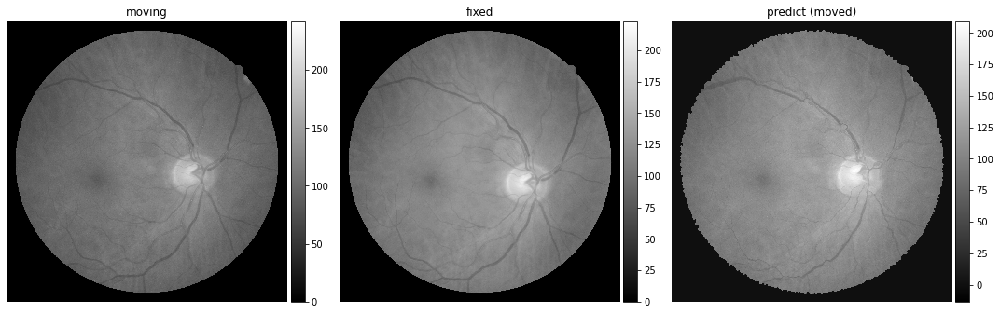


Reg Time (Total): 69.9015
Dice Similarity: 0.46058186888694763


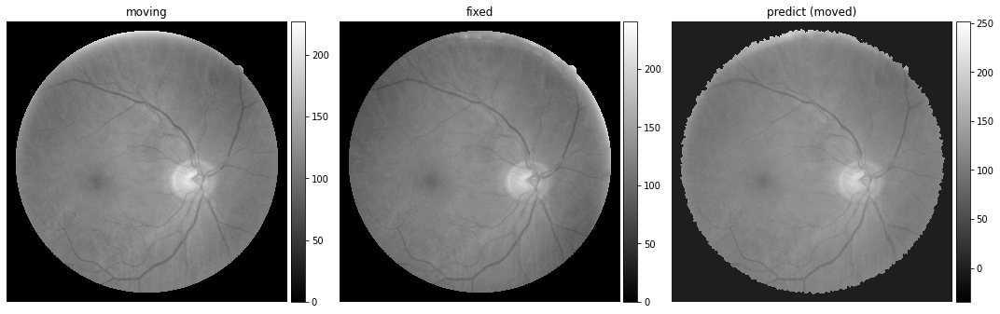


Reg Time (Total): 69.7602
Dice Similarity: 0.4511941969394684


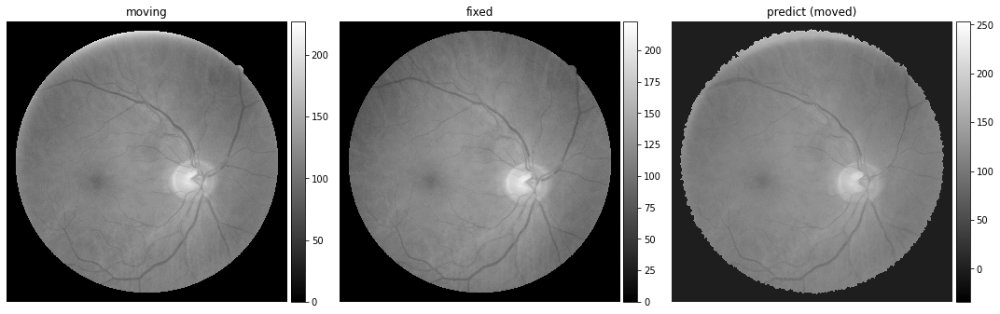


Reg Time (Total): 70.3357
Dice Similarity: 0.45447733998298645


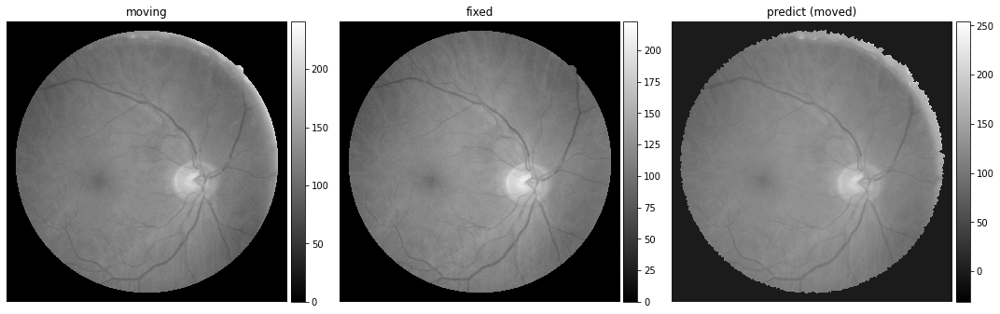


Reg Time (Total): 69.9292
Dice Similarity: 0.3821762204170227


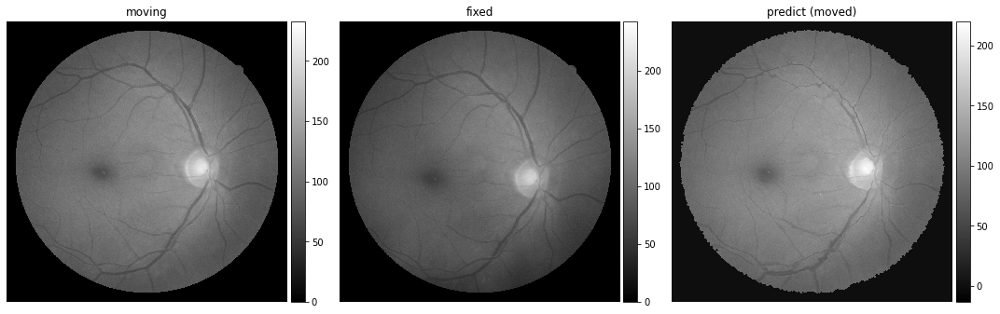


Reg Time (Total): 70.7578
Dice Similarity: 0.4282219111919403


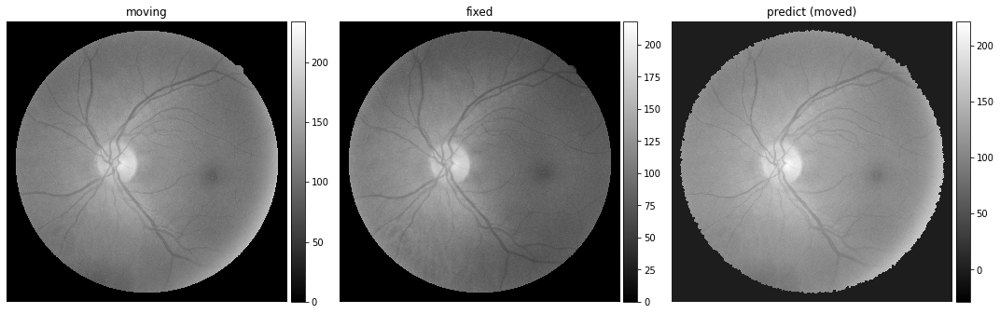


Reg Time (Total): 70.0195
Dice Similarity: 0.41853341460227966


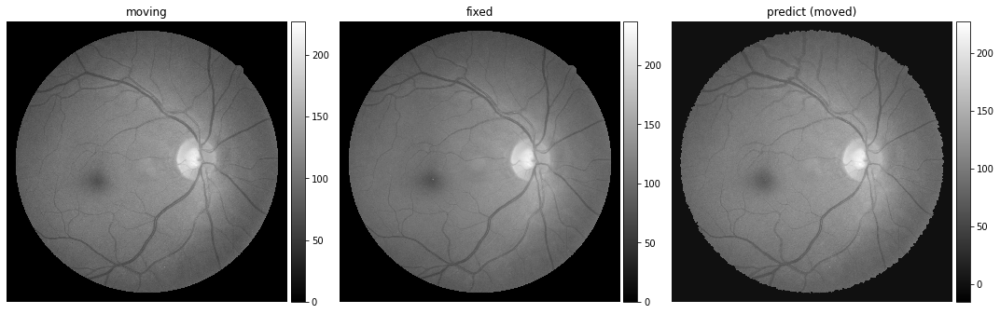


Reg Time (Total): 69.9955
Dice Similarity: 0.42338061332702637


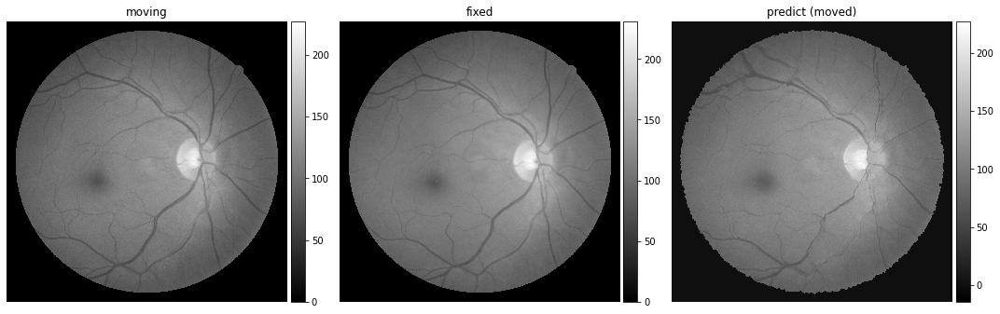


Reg Time (Total): 69.8042
Dice Similarity: 0.4323294162750244


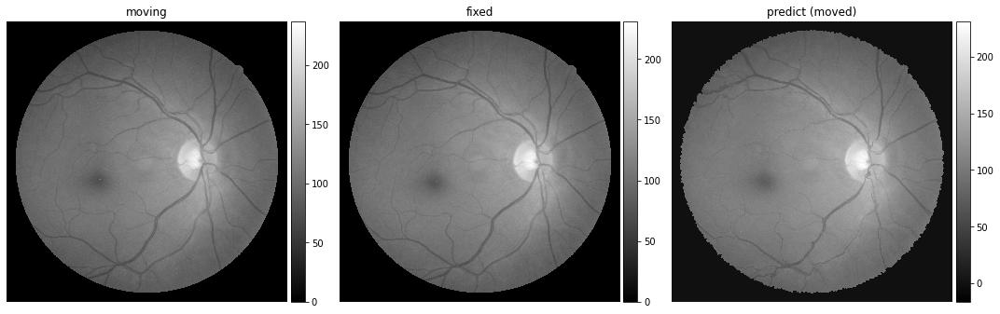


Reg Time (Total): 70.5675
Dice Similarity: 0.43979206681251526


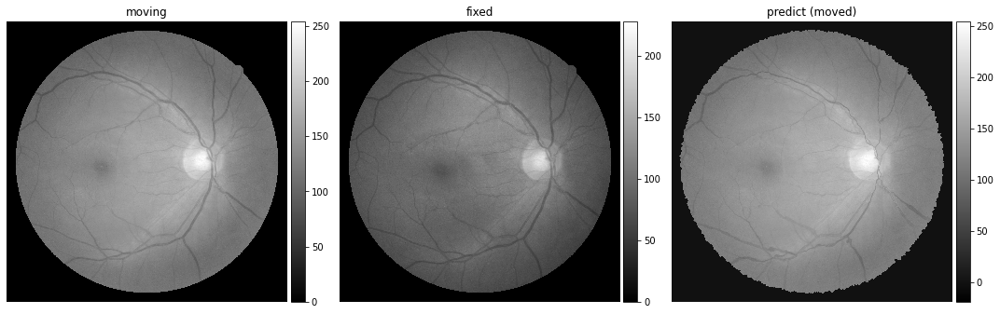


Reg Time (Total): 69.7787
Dice Similarity: 0.42996662855148315


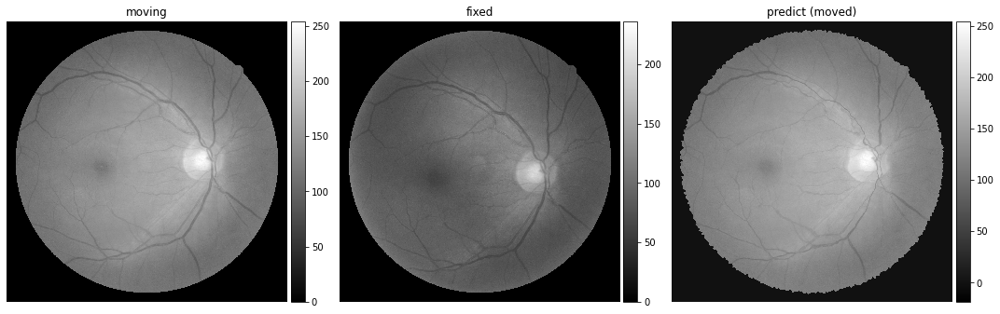


Reg Time (Total): 70.0508
Dice Similarity: 0.36709344387054443


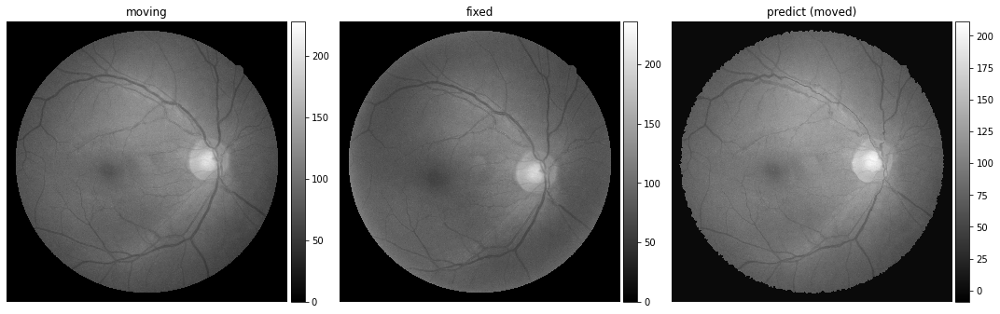


Reg Time (Total): 70.0973
Dice Similarity: 0.45090794563293457


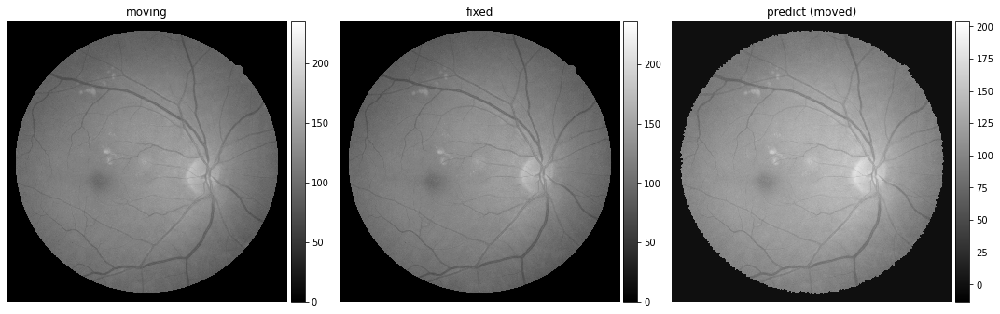


Reg Time (Total): 70.6972
Dice Similarity: 0.4340023398399353


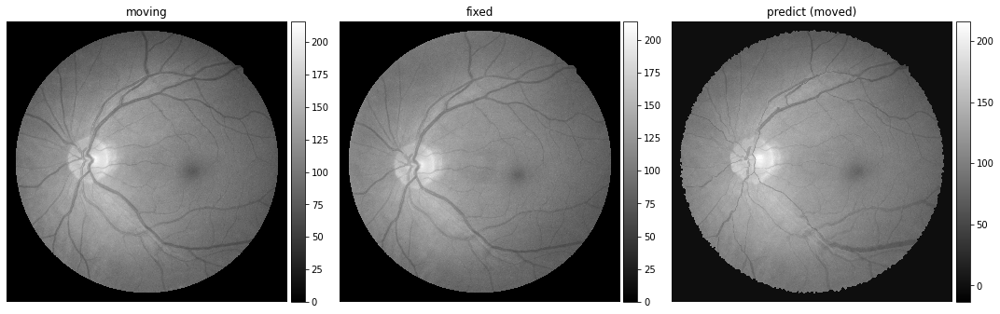


Reg Time (Total): 70.0128
Dice Similarity: 0.4069156348705292


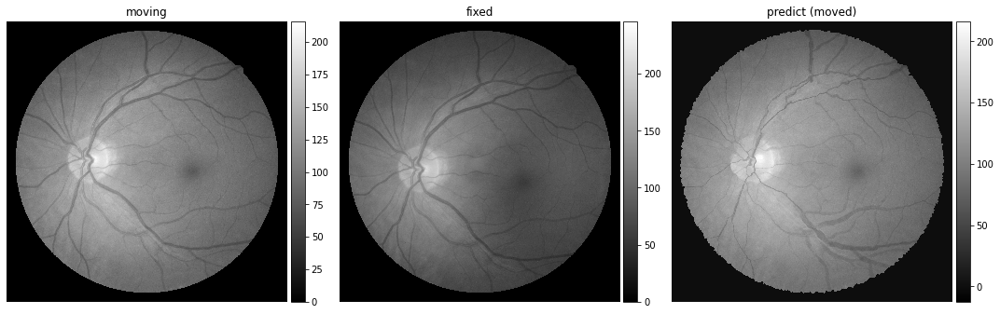


Reg Time (Total): 70.5960
Dice Similarity: 0.4067240357398987


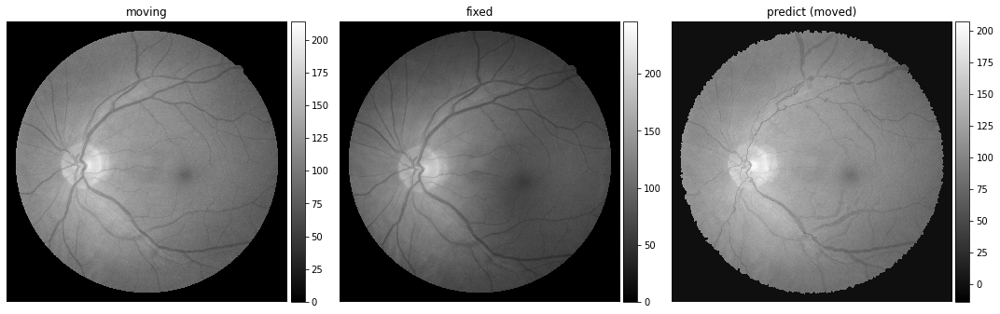


Reg Time (Total): 70.1281
Dice Similarity: 0.4188769459724426


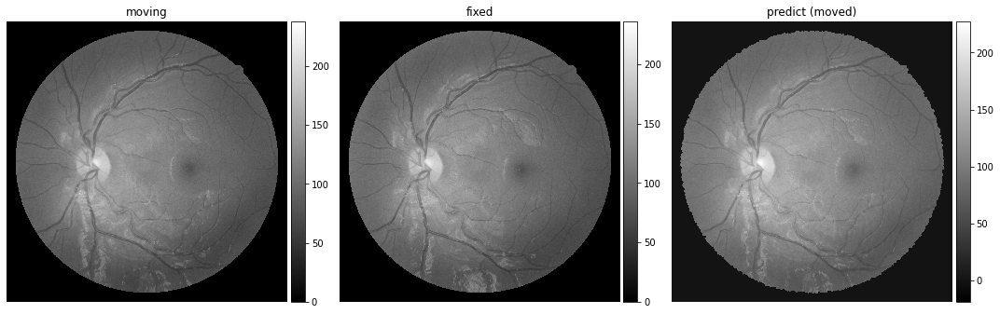


Reg Time (Total): 69.9060
Dice Similarity: 0.42746293544769287


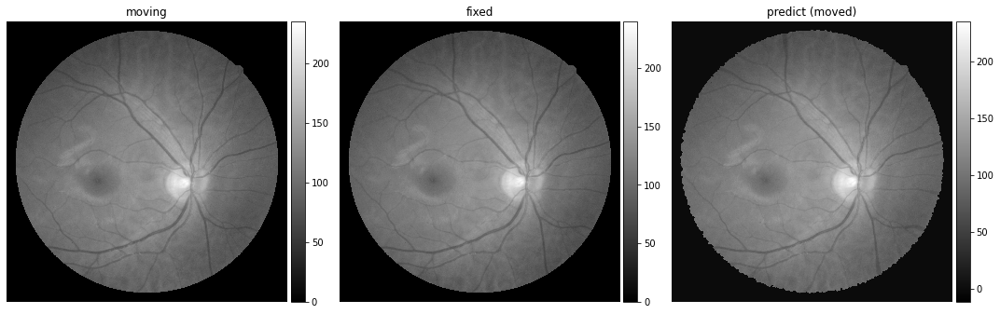


Reg Time (Total): 70.5302
Dice Similarity: 0.4321333169937134


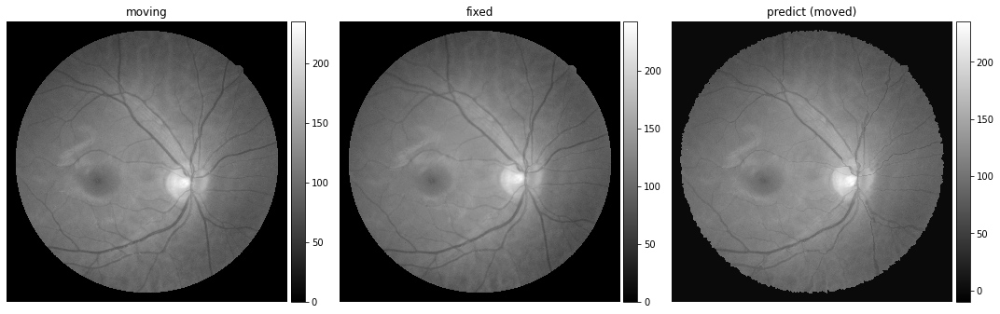


Reg Time (Total): 70.5539
Dice Similarity: 0.436922162771225


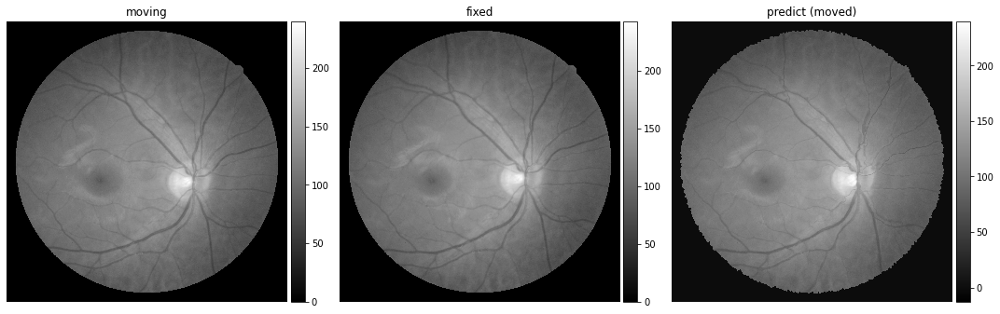


Reg Time (Total): 71.1935
Dice Similarity: 0.42269405722618103


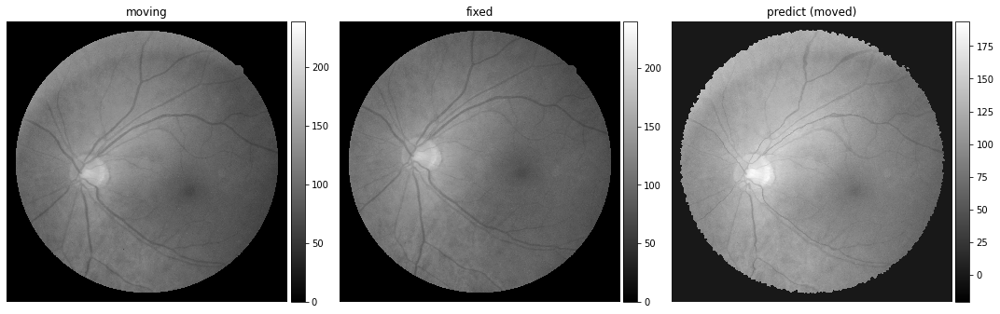


Reg Time (Total): 70.6260
Dice Similarity: 0.42734816670417786


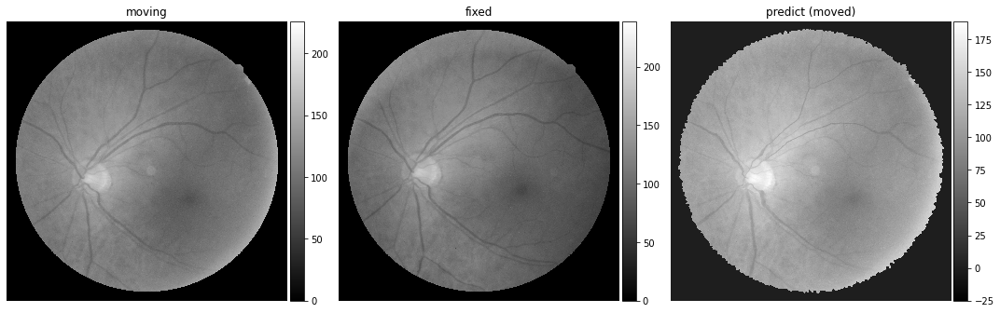


Reg Time (Total): 70.4603
Dice Similarity: 0.4270080626010895


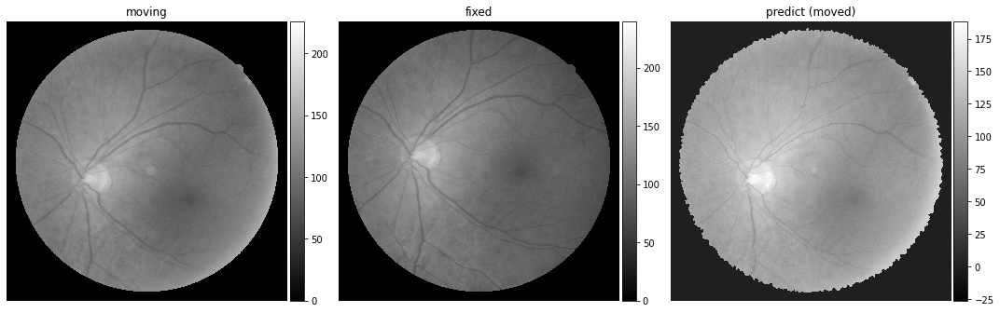

In [50]:
list_images = sorted(glob.glob('FIRE/Images/*'))[188:]

elastixImageFilter = sitk.ElastixImageFilter()
# elastixImageFilter.SetParameterMap(sitk.GetDefaultParameterMap("affine"))

# non-rigid registration
parameterMapVector = sitk.VectorOfParameterMap()
parameterMapVector.append(sitk.GetDefaultParameterMap("affine"))
parameterMapVector.append(sitk.GetDefaultParameterMap("bspline"))
elastixImageFilter.SetParameterMap(parameterMapVector)

for index in range(0, len(list_images), 2):
  # print(index)

  # moving
  val_image_moving = Image.open(list_images[index]).convert('L')

  # fixed
  val_image_fixed = Image.open(list_images[index+1]).convert('L')

  elastix_moving_img = sitk.GetImageFromArray(np.array(val_image_moving))
  elastix_fixed_img = sitk.GetImageFromArray(np.array(val_image_fixed))
  
  elastixImageFilter.SetFixedImage(elastix_fixed_img)
  elastixImageFilter.SetMovingImage(elastix_moving_img)
  
  start = time.time()
  elastixImageFilter.Execute()
  reg_time = time.time() - start

  # sitk.WriteImage(elastixImageFilter.GetResultImage(), 'result.jpg')

  # total registration time
  print('Reg Time (Total): %.4f' % reg_time)

  moved = sitk.GetArrayFromImage(elastixImageFilter.GetResultImage())

  # compute volume overlap (dice)
  overlap = dice_coef(np.array(val_image_fixed).astype('float')/255, moved.astype('float')/255)
  print ("Dice Similarity: {}".format(overlap))

  # To save
  # im = Image.fromarray(moved).convert('RGB')
  # im.save("result.jpeg")

  # plot
  titles = ['moving', 'fixed', 'predict (moved)']
  images = [val_image_moving, val_image_fixed, moved]
  ne.plot.slices(images, titles=titles, cmaps=['gray'], do_colorbars=True);
  print()

# Registration patchify images 2D (convert to scale of gray)

Reg Time (Total): 1215.1655
Dice Similarity: 0.31246888637542725


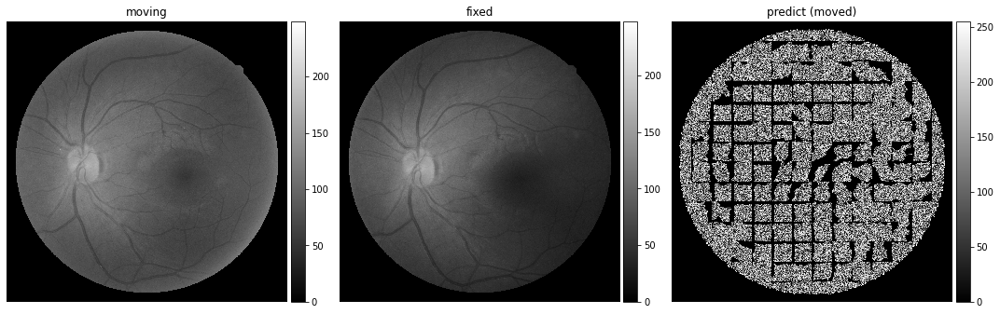

In [8]:
list_images = sorted(glob.glob('FIRE/Images/*'))[188:]

elastixImageFilter = sitk.ElastixImageFilter()
# elastixImageFilter.SetParameterMap(sitk.GetDefaultParameterMap("affine"))

# non-rigid registration
parameterMapVector = sitk.VectorOfParameterMap()
parameterMapVector.append(sitk.GetDefaultParameterMap("affine"))
parameterMapVector.append(sitk.GetDefaultParameterMap("bspline"))
elastixImageFilter.SetParameterMap(parameterMapVector)

for index in range(0, len(list_images), 2):
  patches_moved = []
  reg_time_total = 0

  # moving
  val_image_moving = Image.open(list_images[index]).convert('L')
  patches_moving = patchify(np.array(val_image_moving), (208, 208), step=208)

  # fixed
  val_image_fixed = Image.open(list_images[index+1]).convert('L')
  patches_fixed = patchify(np.array(val_image_fixed), (208, 208), step=208)

  for i in range(patches_moving.shape[0]):
    for j in range(patches_moving.shape[1]):
      single_patch_moving = patches_moving[i,j,:,:]
      single_patch_fixed = patches_fixed[i,j,:,:]

      elastix_moving_img = sitk.GetImageFromArray(np.array(single_patch_moving))
      elastix_fixed_img = sitk.GetImageFromArray(np.array(single_patch_fixed))
      
      elastixImageFilter.SetFixedImage(elastix_fixed_img)
      elastixImageFilter.SetMovingImage(elastix_moving_img)
  
      start = time.time()
      elastixImageFilter.Execute()
      reg_time = time.time() - start

      # sitk.WriteImage(elastixImageFilter.GetResultImage(), 'result.jpg')
      moved = sitk.GetArrayFromImage(elastixImageFilter.GetResultImage())

      reg_time_total = reg_time_total + reg_time
      patches_moved.append(np.expand_dims(moved, axis=0))

  patches_moved = (np.array(patches_moved)*255).astype(np.uint8)
  patches_moved = np.reshape(patches_moved, 
                              (patches_fixed.shape[0], 
                              patches_fixed.shape[1], 
                              patches_fixed.shape[2], 
                              patches_fixed.shape[3]))
  moved_unpatchify = unpatchify(patches_moved, np.array(val_image_fixed).shape)

  # total registration time
  print('Reg Time (Total): %.4f' % reg_time_total)

  # compute volume overlap (dice)
  overlap = dice_coef(np.array(val_image_fixed).astype('float')/255, moved_unpatchify.astype('float')/255)
  print ("Dice Similarity: {}".format(overlap))

  # To save
  # im = Image.fromarray(moved).convert('RGB')
  # im.save("result.jpeg")

  # plot
  titles = ['moving', 'fixed', 'predict (moved)']
  images = [val_image_moving, val_image_fixed, moved_unpatchify]
  ne.plot.slices(images, titles=titles, cmaps=['gray'], do_colorbars=True);
  print()

  break

# Registration images 3D

You can split the images into three grey-level images, one for each color channel, and then set three fixed images, and three moving images. Just make sure that the color channels correspond to each other, i.e. the first fixed images is red, the first moving image is red, etc etc.